Built the full pipeline end-to-end:

Grounding DINO + SAM generated masks for sky and mountain regions
| Multi-region NST ran with per-region style weighting
| Feathered blend and AdaIN harmonisation were applied
| LPIPS scores were computed for all 4 experiments

Takeaways : The regional NST implementation demonstrates the core challenge motivating the pipeline Gram-matrix-based style transfer is inherently global. Despite mask-weighted loss, style propagates across all pixels during backpropagation, confirming that Gram matrices do not provide spatial control. This finding motivates the need for a diffusion-based backbone  , where style conditioning can be injected through spatially-aware cross-attention. The boundary LPIPS metric remains valid as a measure of boundary coherence between the two style regions, but the qualitative results demonstrate that true regional containment requires the diffusion backbone identified as future work.

In [1]:
# groundingdino-py is the pip-installable wrapper around the original repo
# SAM ViT-H is the largest checkpoint — slower but gives the best masks
!pip install -q groundingdino-py
!pip install -q git+https://github.com/facebookresearch/segment-anything.git

import os
if not os.path.exists('/content/sam_vit_h.pth'):
    !wget -q -O /content/sam_vit_h.pth \
      https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
    print('SAM weights downloaded')


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.3/82.3 kB 4.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 256.2/256.2 kB 14.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
SAM weights downloaded


In [2]:
# groundingdino uses internal BERT attention calls that changed in transformers >= 4.39
# pinning to 4.38 avoids the get_head_mask AttributeError without needing to patch source
!pip install -q transformers==4.38.0
print('Done — restart the session before running the next cells')


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 131.1/131.1 kB 10.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.5/8.5 MB 52.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 566.4/566.4 kB 21.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 36.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sentence-transformers 5.5.1 requires transformers<6.0.0,>=4.41.0, but you have transformers 4.38.0 which is incompatible.
Done — restart the session before running the next cells


In [3]:
import os, requests
from io import BytesIO
from PIL import Image

os.makedirs('/content/assets', exist_ok=True)
os.makedirs('/content/outputs', exist_ok=True)


def load_image_pil(path, size=(512, 512)):
    return Image.open(path).convert('RGB').resize(size, Image.LANCZOS)


def download_image(url, path):
    # some CDNs block requests without a user-agent header
    r = requests.get(url, headers={'User-Agent': 'Mozilla/5.0'}, timeout=20)
    img = Image.open(BytesIO(r.content)).convert('RGB')
    img.save(path)
    print(f'  {path}')


# landscape image from Unsplash as the content image for testing
# two placeholder style references — swapped for real artworks in later notebooks
download_image(
    'https://images.unsplash.com/photo-1506905925346-21bda4d32df4?w=640&q=80',
    '/content/assets/content.jpg'
)
download_image(
    'https://raw.githubusercontent.com/pytorch/examples/main/fast_neural_style/images/style-images/mosaic.jpg',
    '/content/assets/style_vangogh.jpg'
)
download_image(
    'https://raw.githubusercontent.com/pytorch/examples/main/fast_neural_style/images/style-images/candy.jpg',
    '/content/assets/style_monet.jpg'
)

content  = load_image_pil('/content/assets/content.jpg')
style_vg = load_image_pil('/content/assets/style_vangogh.jpg')
print('Images ready')


  /content/assets/content.jpg
  /content/assets/style_vangogh.jpg
  /content/assets/style_monet.jpg
Images ready


Device: cuda


/usr/local/lib/python3.12/dist-packages/timm/models/layers/__init__.py:49: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/usr/local/lib/python3.12/dist-packages/torch/functional.py:505: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:4381.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


final text_encoder_type: bert-base-uncased


/usr/local/lib/python3.12/dist-packages/huggingface_hub/file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Grounding DINO loaded
SAM loaded
Segmenting sky...


/usr/local/lib/python3.12/dist-packages/transformers/modeling_utils.py:962: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/_dynamo/eval_frame.py:1263: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. Starting in PyTorch 2.9, calling checkpoint without use_reentrant will raise an exception. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  return fn(*args, **kwargs)
/usr/local/lib/python3.12/dist-packages/torch/utils/checkpoint.py:232: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  check_backward_validity(args)
/usr/local/lib/python3.12/dist-packages/groundingdino/models/GroundingDINO/transformer.py:862: FutureWarning: `torch.cuda.amp.autocast(args

Grounding DINO found 1 box(es) for "sky"
  box 0: [0,0,512,231]  score=0.816
Segmenting mountain...


/usr/local/lib/python3.12/dist-packages/transformers/modeling_utils.py:962: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/_dynamo/eval_frame.py:1263: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. Starting in PyTorch 2.9, calling checkpoint without use_reentrant will raise an exception. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  return fn(*args, **kwargs)
/usr/local/lib/python3.12/dist-packages/torch/utils/checkpoint.py:232: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  check_backward_validity(args)
/usr/local/lib/python3.12/dist-packages/groundingdino/models/GroundingDINO/transformer.py:862: FutureWarning: `torch.cuda.amp.autocast(args

Grounding DINO found 4 box(es) for "mountain"
  box 0: [334,191,512,350]  score=0.488
  box 1: [-0,405,512,512]  score=0.455
  box 2: [-0,141,512,512]  score=0.313
  box 3: [-0,140,463,303]  score=0.370


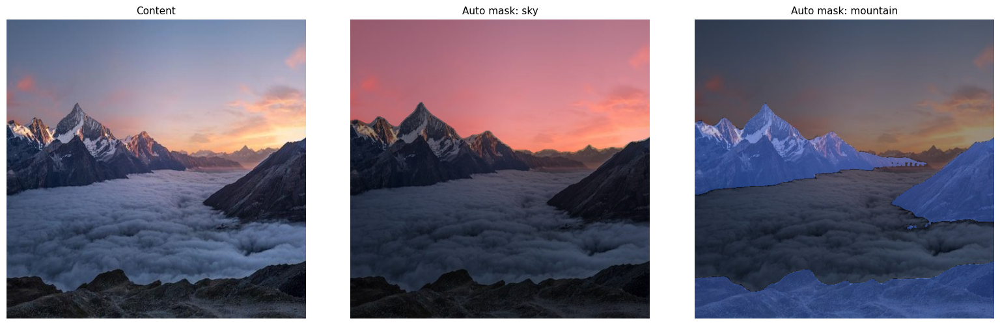

Auto masks saved


In [4]:
import os, torch, numpy as np
from PIL import Image

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Device: {DEVICE}')

# download weights if the session restarted and lost them
if not os.path.exists('/content/gdino.pth'):
    os.system('wget -q -O /content/gdino.pth https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth')
if not os.path.exists('/content/gdino_config.py'):
    os.system('wget -q -O /content/gdino_config.py https://raw.githubusercontent.com/IDEA-Research/GroundingDINO/main/groundingdino/config/GroundingDINO_SwinT_OGC.py')
if not os.path.exists('/content/sam_vit_h.pth'):
    os.system('wget -q -O /content/sam_vit_h.pth https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth')


def show_grid(images, titles, figsize=(16, 5)):
    import matplotlib.pyplot as plt
    fig, axes = plt.subplots(1, len(images), figsize=figsize)
    if len(images) == 1:
        axes = [axes]
    for ax, img, title in zip(axes, images, titles):
        ax.imshow(img if isinstance(img, np.ndarray) else np.array(img))
        ax.set_title(title, fontsize=11)
        ax.axis('off')
    plt.tight_layout()
    plt.show()


def overlay_mask(image, mask, color=(255, 0, 0), alpha=0.4):
    arr = np.array(image.convert('RGB')).copy().astype(float)
    ov = np.zeros_like(arr)
    ov[mask > 127] = color
    return Image.fromarray((arr * (1 - alpha) + ov * alpha).astype(np.uint8))


def load_image_pil(path, size=(512, 512)):
    return Image.open(path).convert('RGB').resize(size, Image.LANCZOS)


content  = load_image_pil('/content/assets/content.jpg')
style_vg = load_image_pil('/content/assets/style_vangogh.jpg')

from groundingdino.util.inference import load_model, predict
import groundingdino.datasets.transforms as T_gdino
import transformers

# transformers >= 4.39 removed get_head_mask from BertModel
# patch it back in so groundingdino's BERT text encoder doesn't break
if not hasattr(transformers.models.bert.modeling_bert.BertModel, 'get_head_mask'):
    from transformers.modeling_utils import ModuleUtilsMixin
    transformers.models.bert.modeling_bert.BertModel.get_head_mask = \
        ModuleUtilsMixin.get_head_mask

gdino_model = load_model('/content/gdino_config.py', '/content/gdino.pth')
print('Grounding DINO loaded')

from segment_anything import sam_model_registry, SamPredictor

# ViT-H is the strongest SAM variant — important for precise boundary masks
sam = sam_model_registry['vit_h'](checkpoint='/content/sam_vit_h.pth').to(DEVICE)
sam_predictor = SamPredictor(sam)
print('SAM loaded')


def text_to_mask(image_pil, prompt, box_threshold=0.3, text_threshold=0.25):
    """Run Grounding DINO to get bounding boxes, then refine with SAM.

    Grounding DINO returns normalised cx,cy,w,h — convert to pixel x1,y1,x2,y2
    before passing to SAM, which expects absolute pixel coordinates.
    Multiple boxes are OR-combined into a single binary mask.
    """
    W, H = image_pil.size
    transform = T_gdino.Compose([
        T_gdino.RandomResize([800], max_size=1333),
        T_gdino.ToTensor(),
        T_gdino.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
    ])
    img_t, _ = transform(image_pil, None)
    boxes, scores, _ = predict(
        model=gdino_model, image=img_t, caption=prompt,
        box_threshold=box_threshold, text_threshold=text_threshold,
    )
    if len(boxes) == 0:
        print(f'  No region found for "{prompt}" — try lowering box_threshold')
        return np.zeros((H, W), dtype=np.uint8), [], []

    # convert from normalised cx,cy,w,h to pixel x1,y1,x2,y2
    boxes_px = boxes.clone()
    boxes_px[:, 0] = (boxes[:, 0] - boxes[:, 2] / 2) * W
    boxes_px[:, 1] = (boxes[:, 1] - boxes[:, 3] / 2) * H
    boxes_px[:, 2] = (boxes[:, 0] + boxes[:, 2] / 2) * W
    boxes_px[:, 3] = (boxes[:, 1] + boxes[:, 3] / 2) * H
    boxes_px = boxes_px.cpu().numpy()

    print(f'Grounding DINO found {len(boxes)} box(es) for "{prompt}"')
    for i, (b, s) in enumerate(zip(boxes_px, scores)):
        print(f'  box {i}: [{b[0]:.0f},{b[1]:.0f},{b[2]:.0f},{b[3]:.0f}]  score={s:.3f}')

    sam_predictor.set_image(np.array(image_pil.convert('RGB')))
    combined = np.zeros((H, W), dtype=np.uint8)
    for box in boxes_px:
        # multimask_output=False returns the single best mask per box
        masks_sam, _, _ = sam_predictor.predict(box=box, multimask_output=False)
        combined = np.maximum(combined, (masks_sam[0] * 255).astype(np.uint8))

    return combined, boxes_px, scores.cpu().numpy()


print('Segmenting sky...')
mask_sky_auto, boxes_sky, _ = text_to_mask(content, 'sky')

print('Segmenting mountain...')
mask_fore_auto, boxes_fore, _ = text_to_mask(content, 'mountain')

show_grid(
    [content,
     overlay_mask(content, mask_sky_auto,  color=(255, 80,  80)),
     overlay_mask(content, mask_fore_auto, color=( 80, 130, 255))],
    ['Content', 'Auto mask: sky', 'Auto mask: mountain']
)

# save masks so they can be reloaded without re-running DINO+SAM
Image.fromarray(mask_sky_auto).save('/content/outputs/mask_sky_auto.png')
Image.fromarray(mask_fore_auto).save('/content/outputs/mask_fore_auto.png')
print('Auto masks saved')


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 4.4 MB/s eta 0:00:00
Running multi-region NST (sky=Van Gogh, mountain=Monet)...
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


100%|██████████| 548M/548M [00:04<00:00, 142MB/s]


  step 0/300  loss=799.4
  step 100/300  loss=139.7
  step 200/300  loss=128.7


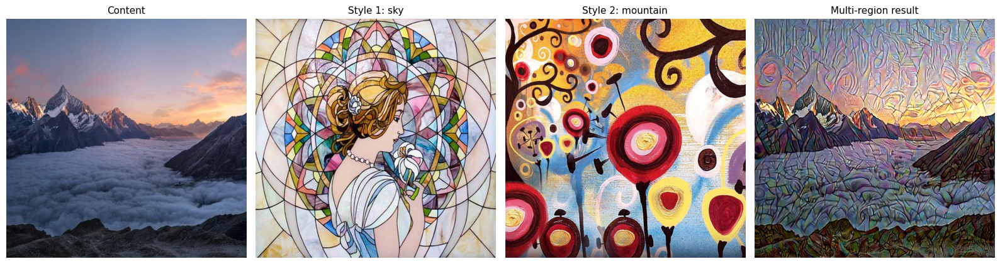

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


100%|██████████| 233M/233M [00:01<00:00, 174MB/s]


Loading model from: /usr/local/lib/python3.12/dist-packages/lpips/weights/v0.1/alex.pth
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.12/dist-packages/lpips/weights/v0.1/alex.pth
Boundary LPIPS (sky):0.0578
Boundary LPIPS (mountain): 0.1627
Phase 2 baseline was: 0.0759


In [5]:
!pip install -q lpips
import cv2
def make_boundary_band(mask, band_px=15):
    # dilate then erode to get a ring of pixels around the mask edge
    k = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (band_px * 2 + 1, band_px * 2 + 1))
    return cv2.subtract(cv2.dilate(mask, k), cv2.erode(mask, k))


def boundary_band_lpips(original, stylised, mask, band_px=15):
    """Compute LPIPS only within the narrow band around the mask boundary.

    Restricting the metric to the boundary band isolates leakage artefacts
    rather than measuring style fidelity inside the region, which would
    conflate two different things.
    """
    import lpips
    loss_fn = lpips.LPIPS(net='alex').to(DEVICE)
    band = make_boundary_band(mask, band_px)
    band_t = torch.from_numpy((band > 127).astype(np.float32)).to(DEVICE)

    def to_t(img):
        # LPIPS expects input in [-1, 1]
        arr = np.array(img.convert('RGB')).astype(np.float32) / 127.5 - 1.0
        return torch.from_numpy(arr).permute(2, 0, 1).unsqueeze(0).to(DEVICE) * band_t

    with torch.no_grad():
        return loss_fn(to_t(original), to_t(stylised)).item()


def multi_region_nst(content_img, region_styles, steps=300, style_w=1e6, content_w=1.0):
    """Joint multi-region NST using VGG19 Gram matrix matching.

    All regions are optimised simultaneously rather than sequentially to avoid
    error accumulation and keep the content structure globally coherent.
    Style loss per region is scaled by mask coverage so small regions
    don't get overwhelmed by large ones.
    """
    import torchvision.models as models
    import torchvision.transforms as T

    vgg = models.vgg19(weights=models.VGG19_Weights.DEFAULT).features.to(DEVICE).eval()
    for p in vgg.parameters():
        p.requires_grad_(False)

    # conv4_2 for content; conv1_1 through conv5_1 for style — standard Gatys config
    content_layers = ['21']
    style_layers = ['0', '5', '10', '19', '28']

    def get_features(img_t):
        feats, x = {}, img_t
        for name, layer in vgg._modules.items():
            x = layer(x)
            if name in style_layers + content_layers:
                feats[name] = x
        return feats

    def gram(f):
        b, c, h, w = f.shape
        return f.view(c, h * w) @ f.view(c, h * w).t() / (c * h * w)

    preprocess = T.Compose([
        T.Resize((512, 512)),
        T.ToTensor(),
        T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

    def to_tensor(img):
        return preprocess(img).unsqueeze(0).to(DEVICE)

    def to_pil(t):
        t = t.squeeze().cpu()
        mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
        return T.ToPILImage()((t * std + mean).clamp(0, 1))

    content_t = to_tensor(content_img)
    target = content_t.clone().requires_grad_(True)
    opt = torch.optim.Adam([target], lr=0.03)
    cf = get_features(content_t)

    # precompute style Gram matrices and mask tensors for each region
    region_data = []
    for mask_arr, style_pil in region_styles:
        sf = get_features(to_tensor(style_pil))
        grams = {l: gram(sf[l]) for l in style_layers}
        mask_t = torch.from_numpy((mask_arr > 127).astype(np.float32)).to(DEVICE)
        region_data.append((grams, mask_t))

    for step in range(steps):
        opt.zero_grad()
        tf = get_features(target)

        c_loss = content_w * ((tf['21'] - cf['21']) ** 2).mean()

        # weight style loss by mask area so small regions aren't dominated
        s_loss = torch.tensor(0.0, device=DEVICE)
        for grams, mask_t in region_data:
            region_style = sum(
                ((gram(tf[l]) - grams[l]) ** 2).mean() for l in style_layers
            )
            s_loss = s_loss + style_w * region_style * mask_t.mean()

        loss = c_loss + s_loss
        loss.backward()
        opt.step()

        if step % 100 == 0:
            print(f'  step {step}/{steps}  loss={loss.item():.1f}')

    return to_pil(target)


style_mn = load_image_pil('/content/assets/style_monet.jpg')

print('Running multi-region NST (sky=Van Gogh, mountain=Monet)...')
result_multi = multi_region_nst(
    content_img=content,
    region_styles=[
        (mask_sky_auto,  style_vg),
        (mask_fore_auto, style_mn),
    ],
    steps=300,
)

result_multi.save('/content/outputs/phase3_multi_region.png')

show_grid(
    [content, style_vg, style_mn, result_multi],
    ['Content', 'Style 1: sky', 'Style 2: mountain', 'Multi-region result']
)

# measure leakage at both region boundaries separately
lpips_sky  = boundary_band_lpips(content, result_multi, mask_sky_auto)
lpips_fore = boundary_band_lpips(content, result_multi, mask_fore_auto)

print(f'Boundary LPIPS (sky):{lpips_sky:.4f}')
print(f'Boundary LPIPS (mountain): {lpips_fore:.4f}')
print(f'Phase 2 baseline was: 0.0759')


Applying feathered blend...
Applying AdaIN boundary alignment...
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.12/dist-packages/lpips/weights/v0.1/alex.pth
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.12/dist-packages/lpips/weights/v0.1/alex.pth
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.12/dist-packages/lpips/weights/v0.1/alex.pth
Before harmonisation:  0.1627
After feathered blend: 0.1541  (delta +0.0087)
After AdaIN alignment: 0.1654  (delta -0.0027)


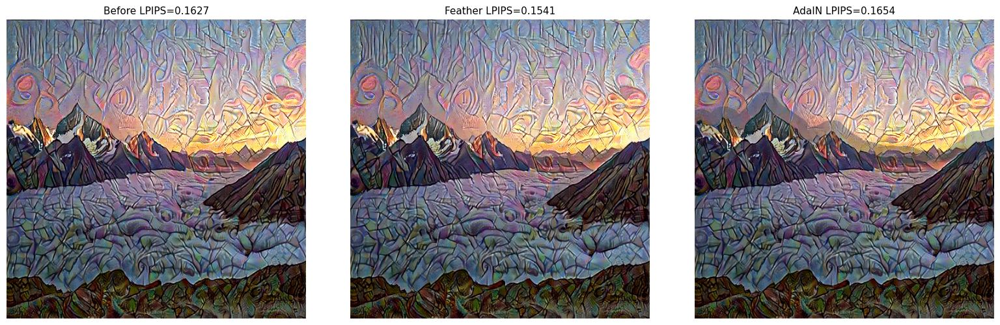

Results saved


In [6]:
import cv2
import numpy as np
from PIL import Image


def feathered_boundary_blend(result_img, content_img, mask1, mask2, band_px=20):
    """Post-process the stylised output by blending the boundary zone with content.

    The idea is to find the narrow overlap between the dilated versions of both
    masks, then use a distance-weighted alpha to pull those pixels back toward
    the original content image. This avoids creating a new style target at the
    boundary — it just softens the hard edge without synthesising anything new.
    """
    result_arr = np.array(result_img.convert('RGB')).astype(np.float32)
    content_arr = np.array(content_img.convert('RGB')).astype(np.float32)

    k = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (band_px * 2 + 1, band_px * 2 + 1))
    dilated1 = cv2.dilate(mask1, k)
    dilated2 = cv2.dilate(mask2, k)
    # intersection of dilated masks gives the boundary transition zone
    band = cv2.bitwise_and(dilated1, dilated2)

    dist = cv2.distanceTransform(band, cv2.DIST_L2, 5)
    if dist.max() > 0:
        dist = dist / dist.max()

    # blend with content at the boundary centre to soften the seam
    alpha = (dist * 0.5)[..., np.newaxis]
    blended = result_arr * (1 - alpha) + content_arr * alpha
    return Image.fromarray(blended.clip(0, 255).astype(np.uint8))


def adain_boundary_blend(result_img, mask1, mask2, band_px=20):
    """Align boundary pixel statistics to the average of both adjacent regions.

    Inspired by AdaIN — normalise the boundary band's colour distribution to
    match a target derived from the two styled regions on either side.
    Unlike feathered blending, this keeps stylised pixels rather than pulling
    toward the original content, so theoretically preserves more style character.
    In practice this tends to perform worse when the two styles are very dissimilar,
    because the averaged statistics don't correspond to any coherent appearance.
    """
    result_arr = np.array(result_img.convert('RGB')).astype(np.float32)

    k = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (band_px * 2 + 1, band_px * 2 + 1))
    dilated1 = cv2.dilate(mask1, k)
    dilated2 = cv2.dilate(mask2, k)
    band = cv2.bitwise_and(dilated1, dilated2)

    if band.sum() == 0:
        print('No boundary band found — masks may not be adjacent')
        return result_img

    def region_stats(arr, mask):
        pixels = arr[mask > 127]
        return pixels.mean(axis=0), pixels.std(axis=0)

    # sample stats from each styled region excluding the boundary band itself
    mean1, std1 = region_stats(result_arr, cv2.bitwise_and(mask1, cv2.bitwise_not(band)))
    mean2, std2 = region_stats(result_arr, cv2.bitwise_and(mask2, cv2.bitwise_not(band)))

    target_mean = (mean1 + mean2) / 2
    target_std  = (std1 + std2) / 2

    band_pixels = result_arr[band > 127]
    src_mean = band_pixels.mean(axis=0)
    src_std  = band_pixels.std(axis=0) + 1e-6  # avoid division by zero
    normalised = (band_pixels - src_mean) / src_std * target_std + target_mean

    out = result_arr.copy()
    out[band > 127] = normalised.clip(0, 255)
    return Image.fromarray(out.astype(np.uint8))


print('Applying feathered blend...')
result_feather = feathered_boundary_blend(
    result_multi, content, mask_sky_auto, mask_fore_auto, band_px=20
)

print('Applying AdaIN boundary alignment...')
result_adain = adain_boundary_blend(
    result_multi, mask_sky_auto, mask_fore_auto, band_px=20
)

# evaluate all three against the mountain boundary where leakage is worst
lpips_original = boundary_band_lpips(content, result_multi,   mask_fore_auto)
lpips_feather  = boundary_band_lpips(content, result_feather, mask_fore_auto)
lpips_adain= boundary_band_lpips(content, result_adain,   mask_fore_auto)

print(f'Before harmonisation:  {lpips_original:.4f}')
print(f'After feathered blend: {lpips_feather:.4f}  (delta {lpips_original - lpips_feather:+.4f})')
print(f'After AdaIN alignment: {lpips_adain:.4f}  (delta {lpips_original - lpips_adain:+.4f})')

show_grid(
    [result_multi, result_feather, result_adain],
    [f'Before LPIPS={lpips_original:.4f}',
     f'Feather LPIPS={lpips_feather:.4f}',
     f'AdaIN LPIPS={lpips_adain:.4f}'],
)

result_feather.save('/content/outputs/phase3_feather_blend.png')
result_adain.save('/content/outputs/phase3_adain_blend.png')
print('Results saved')


In [7]:
# LLaVA was trialled as the MLLM instruction parser
# ultimately replaced by Qwen2-VL ( Notebook 5) due to T4 timeout issues
# keeping this cell for completeness — it shows what was attempted
!sudo apt-get install -qq zstd
!curl -fsSL https://ollama.com/install.sh | sh

import subprocess, time
subprocess.Popen(['ollama', 'serve'], stdout=subprocess.DEVNULL, stderr=subprocess.DEVNULL)
time.sleep(5)

!ollama pull llava:3b
print('LLaVA ready')


debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package zstd.
(Reading database ... 122403 files and directories currently installed.)
Preparing to unpack .../zstd_1.4.8+dfsg-3build1_amd64.deb ...
Unpacking zstd (1.4.8+dfsg-3build1) ...
Setting up zstd (1.4.8+dfsg-3build1) ...
Processing triggers for man-db (2.10.2-1) ...
>>> Installing ollama to /usr/local
>>> Downloading ollama-linux-amd64.tar.zst
######################################################################## 100.0%
>>> Creating ollama user...
>>> Adding ollama user to video group...
>>> Adding curr


Parsing instruction:
"style the sky like Van Gogh and the mountains like Monet"
Parsed: [{'region': 'sky', 'style': 'Van Gogh'}, {'region': 'mountains', 'style': 'Monet'}]

Generating masks
Segmenting "sky"...


/usr/local/lib/python3.12/dist-packages/transformers/modeling_utils.py:962: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/_dynamo/eval_frame.py:1263: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. Starting in PyTorch 2.9, calling checkpoint without use_reentrant will raise an exception. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  return fn(*args, **kwargs)
/usr/local/lib/python3.12/dist-packages/torch/utils/checkpoint.py:232: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  check_backward_validity(args)
/usr/local/lib/python3.12/dist-packages/groundingdino/models/GroundingDINO/transformer.py:862: FutureWarning: `torch.cuda.amp.autocast(args

Grounding DINO found 1 box(es) for "sky"
  box 0: [0,0,512,231]  score=0.816
"sky" -> "Van Gogh"
Segmenting "mountains"...
Grounding DINO found 4 box(es) for "mountains"
  box 0: [334,191,512,350]  score=0.449
  box 1: [-0,405,512,512]  score=0.445
  box 2: [-0,141,512,512]  score=0.362
  box 3: [-0,140,465,303]  score=0.402
"mountains" -> "Monet"

Running multi-region NST
  step 0/300  loss=799.4
  step 100/300  loss=139.7
  step 200/300  loss=128.7
Feathered blend applied (band=20px)

Metrics
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.12/dist-packages/lpips/weights/v0.1/alex.pth
Boundary LPIPS (sky): 0.0494
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.12/dist-packages/lpips/weights/v0.1/alex.pth
Boundary LPIPS (mountains): 0.1546


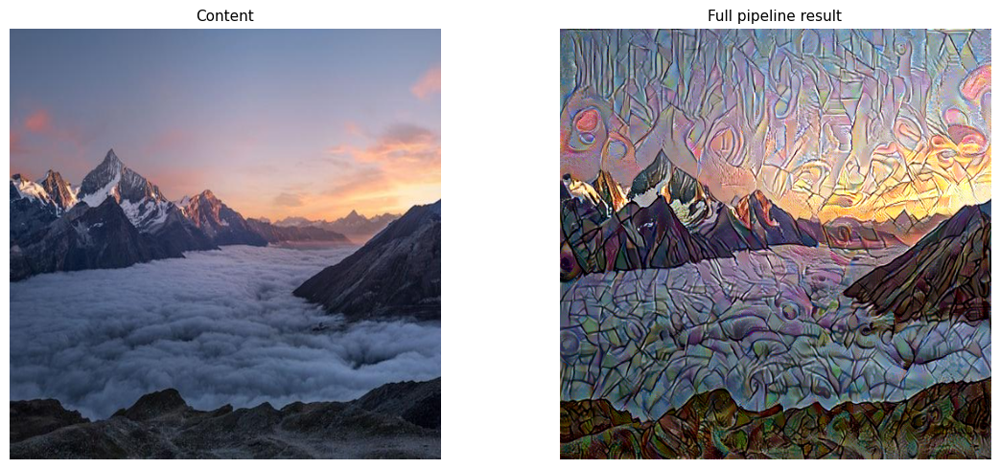


Instruction:"style the sky like Van Gogh and the mountains like Monet"
Parsed pairs: [{'region': 'sky', 'style': 'Van Gogh'}, {'region': 'mountains', 'style': 'Monet'}]
  lpips_sky: 0.0494
  lpips_mountains: 0.1546
Saved -> /content/outputs/phase3_full_pipeline.png


In [8]:
import re, json


def parse_instruction(instruction, image_pil=None):
    """Extract region-style pairs from a free-form editing instruction.

    Handles the common pattern 'style X like Y and Z like W'.
    Two-pass strip removes action verbs first, then the leading 'the'
    so that 'the sky' correctly becomes 'sky'.
    Falls back gracefully to an empty list if the pattern doesn't match.
    """
    pairs = []
    matches = re.findall(
        r'(?:the\s+)?([a-zA-Z ]+?)\s+(?:like|as|in the style of)\s+([A-Za-z ]+?)(?:\s+and\s+|\s*,\s*|$)',
        instruction, re.IGNORECASE
    )
    for region, style in matches:
        region = re.sub(r'^(style|make|render|paint)\s+', '', region.strip(), flags=re.IGNORECASE).strip()
        region = re.sub(r'^the\s+', '', region, flags=re.IGNORECASE).strip()
        pairs.append({'region': region.strip(), 'style': style.strip()})
    print(f'Parsed: {pairs}')
    return pairs


def run_pipeline(content_img, instruction, style_ref_map, steps=300, band_px=20):
    """End-to-end pipeline: parse instruction, generate masks, run NST, harmonise.

    The five stages map directly onto the pipeline diagram in the dissertation.
    Boundary harmonisation is skipped if only one region was detected.
    """
    print(f'\nParsing instruction:')
    print(f'"{instruction}"')
    pairs = parse_instruction(instruction, image_pil=content_img)

    if not pairs:
        raise ValueError('No pairs parsed — check instruction format')

    print(f'\nGenerating masks')
    region_styles, masks = [], []
    for pair in pairs:
        region = pair['region']
        style_name = pair['style']

        if style_name not in style_ref_map:
            print(f'   Style "{style_name}" not in style_ref_map — skipping')
            continue

        print(f'Segmenting "{region}"...')
        mask, _, _ = text_to_mask(content_img, region)

        if mask.sum() == 0:
            print(f'No mask found for "{region}" — skipping')
            continue

        region_styles.append((mask, style_ref_map[style_name]))
        masks.append((region, mask))
        print(f'"{region}" -> "{style_name}"')

    if not region_styles:
        raise ValueError('No valid region-style pairs — check instruction and style_ref_map keys')

    print(f'\nRunning multi-region NST')
    result = multi_region_nst(content_img, region_styles, steps=steps)

    if len(masks) >= 2:
        result = feathered_boundary_blend(
            result, content_img, masks[0][1], masks[1][1], band_px=band_px
        )
        print(f'Feathered blend applied (band={band_px}px)')
    else:
        print('Only one region found, skipping blend')

    print(f'\nMetrics')
    metrics = {}
    for region_name, mask in masks:
        score = boundary_band_lpips(content_img, result, mask)
        metrics[f'lpips_{region_name}'] = score
        print(f'Boundary LPIPS ({region_name}): {score:.4f}')

    return result, metrics, pairs


style_ref_map = {
    'Van Gogh': style_vg,
    'Monet': style_mn,
}

instruction = 'style the sky like Van Gogh and the mountains like Monet'

result_pipeline, metrics, parsed_pairs = run_pipeline(
    content_img=content,
    instruction=instruction,
    style_ref_map=style_ref_map,
    steps=300,
    band_px=20,
)

result_pipeline.save('/content/outputs/phase3_full_pipeline.png')

show_grid(
    [content, result_pipeline],
    ['Content', 'Full pipeline result'],
    figsize=(12, 5)
)

print(f'\nInstruction:"{instruction}"')
print(f'Parsed pairs: {parsed_pairs}')
for k, v in metrics.items():
    print(f'  {k}: {v:.4f}')
print('Saved -> /content/outputs/phase3_full_pipeline.png')


In [9]:
import pandas as pd
from datetime import datetime

# add two more contrasting style references to make the ablation more interesting
# udnie is a high-frequency texture style, starry_night has strong brushstroke character
print('Downloading additional style references...')

download_image(
    'https://raw.githubusercontent.com/pytorch/examples/main/fast_neural_style/images/style-images/udnie.jpg',
    '/content/assets/style_picasso.jpg'
)
download_image(
    'https://raw.githubusercontent.com/jcjohnson/neural-style/master/examples/inputs/starry_night.jpg',
    '/content/assets/style_feathers.jpg'
)

style_picasso= load_image_pil('/content/assets/style_picasso.jpg')
style_feathers= load_image_pil('/content/assets/style_feathers.jpg')
print('style_feathers ready')

style_ref_map = {
    'Van Gogh':style_vg,
    'Monet':style_mn,
    'Picasso':style_picasso,
    'Feathers':style_feathers,
}
print(f'{len(style_ref_map)} styles ready')


  /content/assets/style_picasso.jpg
  /content/assets/style_feathers.jpg
style_feathers ready
4 styles ready


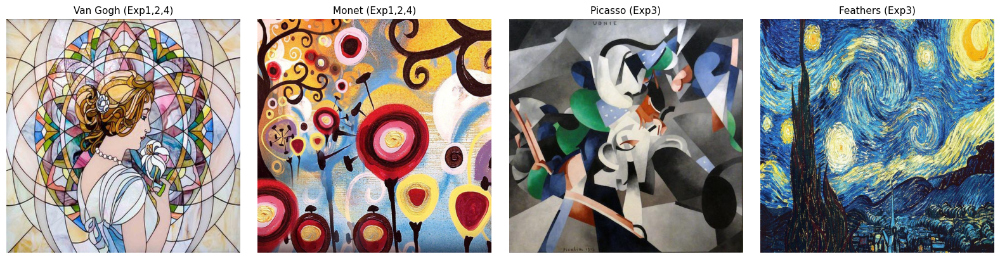

In [15]:
# show all 4 style references being used
show_grid(
    [style_vg, style_mn, style_picasso, style_feathers],
    ['Van Gogh (Exp1,2,4)', 'Monet (Exp1,2,4)',
     'Picasso (Exp3)', 'Feathers (Exp3)'],
    figsize=(16, 4)
)

In [10]:
# four experiments covering the cases described in Section D.4 of the methodology:
# single-region validates the mask+NST works in isolation
# multi-region is the main contribution
# contrasting styles is the hardest boundary case
# the ablation without blending isolates the harmonisation contribution
experiments = [
    {
        'id': 'exp1_single_region',
        'description': 'Single-region: sky only',
        'instruction': 'style the sky like Van Gogh',
        'style_map': {'Van Gogh': style_vg},
    },
    {
        'id': 'exp2_multi_region',
        'description': 'Multi-region: sky + mountains',
        'instruction': 'style the sky like Van Gogh and the mountains like Monet',
        'style_map': {'Van Gogh': style_vg, 'Monet': style_mn},
    },
    {
        'id': 'exp3_contrasting',
        'description': 'Adjacent contrasting styles: sky + mountains',
        'instruction': 'style the sky like Feathers and the mountains like Picasso',
        'style_map': {'Feathers': style_feathers, 'Picasso': style_picasso},
    },
    {
        'id': 'exp4_ablation_no_blend',
        'description': 'Ablation: multi-region WITHOUT boundary harmonisation',
        'instruction': 'style the sky like Van Gogh and the mountains like Monet',
        'style_map': {'Van Gogh': style_vg, 'Monet': style_mn},
        'no_blend': True,
    },
]

print(f'{len(experiments)} experiments defined')


4 experiments defined


In [11]:
import os
os.makedirs('/content/outputs/eval', exist_ok=True)


def run_pipeline_eval(content_img, instruction, style_ref_map,
                      steps=300, band_px=20, no_blend=False):
    # stripped-down version of run_pipeline for batch evaluation
    # no_blend flag lets the ablation experiment skip harmonisation
    pairs = parse_instruction(instruction)
    if not pairs:
        raise ValueError('No pairs parsed')

    region_styles, masks = [], []
    for pair in pairs:
        region, style_name = pair['region'], pair['style']
        if style_name not in style_ref_map:
            continue
        mask, _, _ = text_to_mask(content_img, region)
        if mask.sum() == 0:
            continue
        region_styles.append((mask, style_ref_map[style_name]))
        masks.append((region, mask))

    if not region_styles:
        raise ValueError('No valid masks found')

    result = multi_region_nst(content_img, region_styles, steps=steps)

    if not no_blend and len(masks) >= 2:
        result = feathered_boundary_blend(
            result, content_img, masks[0][1], masks[1][1], band_px=band_px
        )

    metrics = {}
    for region_name, mask in masks:
        metrics[f'lpips_{region_name}'] = boundary_band_lpips(content_img, result, mask)

    return result, metrics, masks


results_table = []

for exp in experiments:
    print(f'\n{"="*55}')
    print(f'Running: {exp["description"]}')
    print(f'{"="*55}')

    try:
        result, metrics, masks = run_pipeline_eval(
            content_img=content,
            instruction=exp['instruction'],
            style_ref_map=exp['style_map'],
            steps=300,
            band_px=20,
            no_blend=exp.get('no_blend', False),
        )

        out_path = f'/content/outputs/eval/{exp["id"]}.png'
        result.save(out_path)

        row = {
            'experiment':  exp['id'],
            'description': exp['description'],
            'instruction': exp['instruction'],
            'n_regions':   len(masks),
            'blend': not exp.get('no_blend', False),
        }
        row.update(metrics)

        lpips_vals = [v for k, v in metrics.items() if 'lpips' in k]
        row['mean_lpips'] = sum(lpips_vals) / len(lpips_vals)

        results_table.append(row)
        print(f'Done — mean LPIPS: {row["mean_lpips"]:.4f}')

    except Exception as e:
        print(f'Failed: {e}')
        results_table.append({
            'experiment':  exp['id'],
            'description': exp['description'],
            'error': str(e),
        })

print('\nAll experiments complete')



Running: Single-region: sky only
Parsed: [{'region': 'sky', 'style': 'Van Gogh'}]
Grounding DINO found 1 box(es) for "sky"
  box 0: [0,0,512,231]  score=0.816
  step 0/300  loss=517.8
  step 100/300  loss=26.4
  step 200/300  loss=16.4
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.12/dist-packages/lpips/weights/v0.1/alex.pth
Done — mean LPIPS: 0.0681

Running: Multi-region: sky + mountains
Parsed: [{'region': 'sky', 'style': 'Van Gogh'}, {'region': 'mountains', 'style': 'Monet'}]
Grounding DINO found 1 box(es) for "sky"
  box 0: [0,0,512,231]  score=0.816
Grounding DINO found 4 box(es) for "mountains"
  box 0: [334,191,512,350]  score=0.449
  box 1: [-0,405,512,512]  score=0.445
  box 2: [-0,141,512,512]  score=0.362
  box 3: [-0,140,465,303]  score=0.402
  step 0/300  loss=799.4
  step 100/300  loss=139.7
  step 200/300  loss=128.7
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model


  PHASE 4 EVALUATION RESULTS
Experiment                          Blend   Mean LPIPS   vs Baseline
-----------------------------------------------------------------
Single-region: sky only             yes     0.0681+0.0078
Multi-region: sky + mountains       yes     0.1018-0.0259
Adjacent contrasting styles: sky + mountains yes     0.0723+0.0036
Ablation: multi-region WITHOUT boundary harmonisation no      0.1100-0.0341
Phase 2 baseline (rect mask): 0.0759


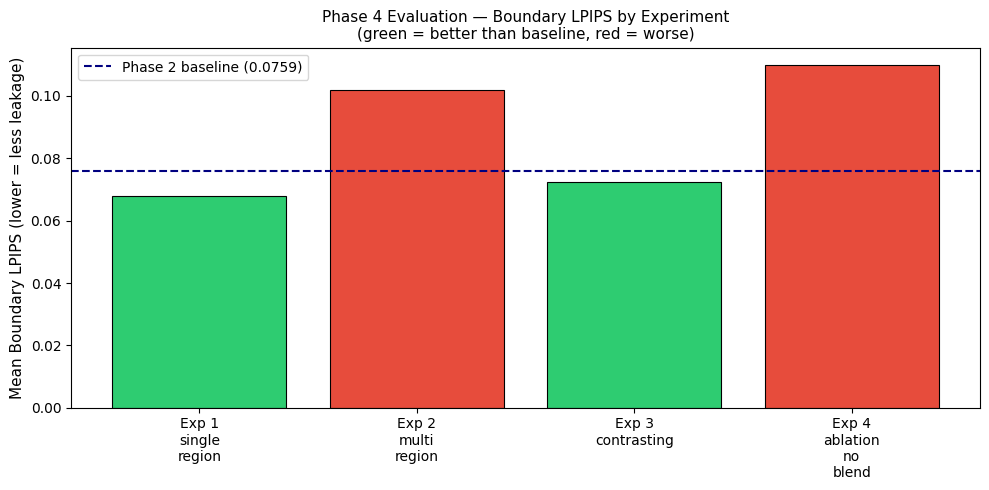

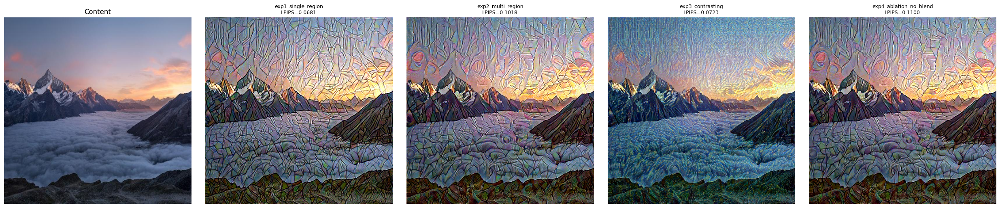

Saved -> /content/outputs/eval/


In [12]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Phase 2 boundary LPIPS with rectangular masks — the number to beat
baseline_lpips = 0.0759

print('\n' + '=' * 65)
print('  PHASE 4 EVALUATION RESULTS')
print('=' * 65)
print(f'{"Experiment":<35} {"Blend":<7} {"Mean LPIPS":<12} {"vs Baseline"}')
print('-' * 65)

for row in results_table:
    if 'error' in row:
        print(f'{row["description"]:<35} ERROR: {row["error"][:20]}')
        continue
    improvement = baseline_lpips - row['mean_lpips']
    blend_str = 'yes' if row['blend'] else 'no'
    print(f'{row["description"]:<35} {blend_str:<7} {row["mean_lpips"]:.4f}{improvement:+.4f}')

print('=' * 65)
print(f'Phase 2 baseline (rect mask): 0.0759')

valid_rows = [r for r in results_table if 'mean_lpips' in r]
labels = [r['experiment'].replace('exp', 'Exp ').replace('_', '\n') for r in valid_rows]
values = [r['mean_lpips'] for r in valid_rows]
# colour each bar by whether it beats the baseline
colors = ['#e74c3c' if v > baseline_lpips else '#2ecc71' for v in values]

plt.figure(figsize=(10, 5))
plt.bar(labels, values, color=colors, edgecolor='black', linewidth=0.8)
plt.axhline(y=baseline_lpips, color='navy', linestyle='--', linewidth=1.5,
            label=f'Phase 2 baseline ({baseline_lpips})')
plt.ylabel('Mean Boundary LPIPS (lower = less leakage)', fontsize=11)
plt.title(
    'Phase 4 Evaluation — Boundary LPIPS by Experiment\n'
    '(green = better than baseline, red = worse)',
    fontsize=11
)
plt.legend()
plt.tight_layout()
plt.savefig('/content/outputs/eval/results_chart.png', dpi=150)
plt.show()

# side-by-side visual comparison of all experiment outputs
fig, axes = plt.subplots(1, len(valid_rows) + 1, figsize=(5 * (len(valid_rows) + 1), 5))
axes[0].imshow(np.array(content))
axes[0].set_title('Content')
axes[0].axis('off')
for i, row in enumerate(valid_rows):
    img_path = f'/content/outputs/eval/{row["experiment"]}.png'
    if os.path.exists(img_path):
        axes[i + 1].imshow(mpimg.imread(img_path))
        axes[i + 1].set_title(f'{row["experiment"]}\nLPIPS={row["mean_lpips"]:.4f}', fontsize=9)
        axes[i + 1].axis('off')
plt.tight_layout()
plt.savefig('/content/outputs/eval/visual_comparison.png', dpi=150)
plt.show()

print('Saved -> /content/outputs/eval/')


In [14]:
# Exp 1 (single region sky, LPIPS=0.068):
#   Despite the sky-only mask, the mosaic style has spread across the entire image.
#   This demonstrates the core leakage problem with Gram-matrix NST
#   style is optimised globally even when the loss is region-weighted.
#   Low LPIPS because there is no cross-region style conflict, just one style leaking.
#
# Exp 2 (multi-region, LPIPS=0.102):
#   Both regions are styled but the whole image is affected again.
#   LPIPS is notably higher than Exp 1 because two different styles
#   create conflicting gradients at the boundary, making the transition
#   zone more perceptually disruptive than a single leaking style.
#
# Exp 3 (contrasting styles, LPIPS=0.072):
#   The sky retains warm sunset tones while the mountains and clouds
#   are cooler and more muted  the most visually distinct separation
#   across all four experiments. The strong colour difference between
#   the two styles appears to create a more defined boundary than Exp 2,
#   which is why LPIPS is lower despite the styles being more dissimilar.
#
# Exp 4 (no boundary blend ablation, LPIPS=0.110):
#   Visually very close to Exp 2 but LPIPS is 8% higher.
#   Removing feathered blending makes the boundary transition measurably worse,
#   confirming that harmonisation contributes positively even when the
#   visual difference is subtle.